In [25]:
import numpy as np
from scipy.io import loadmat
import pyopenlpt as lpt

redirector = lpt.PythonStreamRedirector()

config_file = "D:/0.Code/Test/SD0075/config.txt"
basic_settings = lpt.BasicSetting()
basic_settings.readConfig(config_file)

tr_cfg = lpt.TracerConfig()
tr_cfg.readConfig(basic_settings._object_config_paths[0], basic_settings)

True

In [26]:
# prepare data

from scipy.io import loadmat

# check the ghost objs from the stereomatch step
track_path = "D:/0.Code/Test/SD0075/particles_75k_100f.mat"
tracks = loadmat(track_path)['tracks']  

pts_groundtrue = tracks[tracks[:, 3] == 1, :3].astype(np.float32)

obj3d_list = [lpt.Tracer3D(lpt.Pt3D(pt[0], pt[1], pt[2])) for pt in pts_groundtrue]
cam_list = basic_settings._cam_list
for obj in obj3d_list:
    obj.projectObject2D(cam_list)

# remove objs with one or more projection out of image bounds
w_img = cam_list[0].getNCol()
h_img = cam_list[0].getNRow()
obj3d_list_filtered = []
for obj in obj3d_list:
    valid = True
    for cam in range(len(cam_list)):
        if obj._obj2d_list[cam]._pt_center[0] < 0 or obj._obj2d_list[cam]._pt_center[0] >= w_img \
        or obj._obj2d_list[cam]._pt_center[1] < 0 or obj._obj2d_list[cam]._pt_center[1] >= h_img:
            valid = False
            break
    if valid:
        obj3d_list_filtered.append(obj)

obj3d_list = obj3d_list_filtered

obj2d_list = []
for cam in range(len(cam_list)):
    obj2ds = []
    for obj in obj3d_list:
        obj2ds.append(obj._obj2d_list[cam])
    obj2d_list.append(obj2ds)

print(f"Total {len(obj3d_list)} 3D objects with all projections in image bounds.")

Total 61832 3D objects with all projections in image bounds.


In [27]:
# ===== 生成 PeakCNN 训练图片 =====
import os, math, csv, random 
import numpy as np 
import cv2 
# ===== 路径与参数 ===== 
save_dir = "D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data" 
os.makedirs(save_dir, exist_ok=True) 
# OTF（椭圆高斯渲染）参数 
A, sigma_x, sigma_y, alpha = 125.0, 0.65, 0.65, 0.0 # alpha: 弧度 
num_groups = 10 
# ===== 从 cam0 取 2D 投影点（显式读取 _pt_center[0], [1]）===== 
cam0_objs = obj2d_list[0] # List[lpt.Tracer2D] 
pts2d = [(float(o._pt_center[0]), float(o._pt_center[1])) for o in cam0_objs] 
N = len(pts2d) 
print(f"cam0 points: {N}") 
# ===== 图像尺寸 ===== 
h_img = cam_list[0].getNRow() 
w_img = cam_list[0].getNCol() 
# ===== 打乱并分成 10 组 ===== 
random.shuffle(pts2d) 
chunk_size = (N + num_groups - 1) // num_groups # 尽量均分 
groups = [pts2d[i*chunk_size:(i+1)*chunk_size] for i in range(num_groups)] 
# ===== 椭圆高斯渲染 ===== 
def render_gaussian(img, x, y, A, sx, sy, alpha): 
    """在灰度图 img 上绘制一个椭圆高斯（支持亚像素中心与旋转）""" 
    h, w = img.shape 
    R = int(math.ceil(3.0 * max(sx, sy))) 
    cos_a, sin_a = math.cos(alpha), math.sin(alpha) 
    x0, y0 = int(x), int(y) 
    ymin, ymax = max(0, y0 - R), min(h - 1, y0 + R) 
    xmin, xmax = max(0, x0 - R), min(w - 1, x0 + R) 
    for yy in range(ymin, ymax + 1): 
        dy = yy - y 
        for xx in range(xmin, xmax + 1): 
            dx = xx - x 
            # 旋转到OTF主轴 
            xr = cos_a * dx + sin_a * dy 
            yr = -sin_a * dx + cos_a * dy 
            val = A * math.exp(-0.5 * ((xr/sx)**2 + (yr/sy)**2)) 
            img[yy, xx] =max(img[yy, xx], val) 

# ===== 生成并保存 ===== 
for gi, group in enumerate(groups): 
    img = np.zeros((h_img, w_img), dtype=np.float32) 
    # 渲染该组所有点 
    for (x, y) in group: 
        # 越界保护（一般前面已过滤，这里再兜底） 
        if not (0 <= x < w_img and 0 <= y < h_img): continue 
        render_gaussian(img, x, y, A, sigma_x, sigma_y, alpha) 
    
    # 归一化保存（避免全零除零） 
    mx = float(img.max()) 
    img_u8 = (img / mx * 255.0).astype(np.uint8) if mx > 0 else np.zeros_like(img, dtype=np.uint8) 
    cv2.imwrite(os.path.join(save_dir, f"img_group_{gi:02d}.tif"), img_u8) 
    # 保存标签 CSV（亚像素坐标） 
    with open(os.path.join(save_dir, f"label_group_{gi:02d}.csv"), "w", newline="") as f: 
        wr = csv.writer(f) 
        wr.writerow(["x", "y"]) 
        wr.writerows(group) 
        print(f"Saved group {gi:02d}: {len(group)} points")
    
print("✅ Done: 10 low-density images written to", save_dir)



cam0 points: 61832
Saved group 00: 6184 points
Saved group 01: 6184 points
Saved group 02: 6184 points
Saved group 03: 6184 points
Saved group 04: 6184 points
Saved group 05: 6184 points
Saved group 06: 6184 points
Saved group 07: 6184 points
Saved group 08: 6184 points
Saved group 09: 6176 points
✅ Done: 10 low-density images written to D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data


In [28]:
# ===== 从 PeakCNN 训练图片生成标签 =====
import os, glob, csv
import numpy as np
import cv2

# ===== 路径与基本设置 =====
data_dir   = "D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data"
img_paths  = sorted(glob.glob(os.path.join(data_dir, "img_group_*.tif")))
assert img_paths, f"No tif found in {data_dir}"

# 你已有：
obj_finder = lpt.ObjectFinder2D()
#   tr_cfg     = TracerConfig(...)
# 这里默认已经在外面初始化好，直接使用。

# ===== 标签构造：二值峰图 k 和亚像素偏移 u,v（OpenLPT 坐标定义）=====
def build_label_maps(h, w, peaks_xy):
    k = np.zeros((h, w), dtype=np.uint8)
    u = np.zeros((h, w), dtype=np.float32)
    v = np.zeros((h, w), dtype=np.float32)
    for (x, y) in peaks_xy:
        if 0 <= x < w and 0 <= y < h:
            i = int(np.floor(y))  # row index
            j = int(np.floor(x))  # col index
            k[i, j] = 1
            # ⬇️ 注意：不再加 0.5，因为像素中心定义在整数点
            u[i, j] = float(x) - j
            v[i, j] = float(y) - i
    return k, u, v

def save_csv(csv_path, peaks_xy):
    with open(csv_path, "w", newline="") as f:
        wr = csv.writer(f)
        wr.writerow(["x", "y"])
        wr.writerows(peaks_xy)

# ===== 可选：导出 256×256 tiles =====
export_tiles = True
tile_size    = 256
tiles_dir    = os.path.join(data_dir, "tiles256")
os.makedirs(tiles_dir, exist_ok=True)

def tile_and_save(img_u8, k, u, v, base_name):
    H, W = img_u8.shape
    pad_h = (tile_size - H % tile_size) % tile_size
    pad_w = (tile_size - W % tile_size) % tile_size
    if pad_h or pad_w:
        img_u8 = cv2.copyMakeBorder(img_u8, 0, pad_h, 0, pad_w, cv2.BORDER_REFLECT_101)
        k      = cv2.copyMakeBorder(k,      0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=0)
        u      = cv2.copyMakeBorder(u,      0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=0.0)
        v      = cv2.copyMakeBorder(v,      0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=0.0)

    HH, WW = img_u8.shape
    tid = 0
    for top in range(0, HH, tile_size):
        for left in range(0, WW, tile_size):
            tile_img = img_u8[top:top+tile_size, left:left+tile_size].astype(np.float32)
            mx = float(tile_img.max())
            if mx > 0:
                tile_img /= mx  # 归一化到 [0,1]

            np.savez_compressed(
                os.path.join(tiles_dir, f"{base_name}_t{tid:03d}.npz"),
                img=tile_img,                        # (H,W) float32 [0,1]
                k=k[top:top+tile_size, left:left+tile_size],
                u=u[top:top+tile_size, left:left+tile_size],
                v=v[top:top+tile_size, left:left+tile_size]
            )
            tid += 1

# ===== 主循环 =====
for img_path in img_paths:
    # 读 tif 单通道
    img_u8 = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
    if img_u8 is None:
        print("Skip unreadable:", img_path)
        continue
    if img_u8.ndim == 3:
        img_u8 = cv2.cvtColor(img_u8, cv2.COLOR_BGR2GRAY)
    if img_u8.dtype != np.uint8:
        img_u8 = (img_u8.astype(np.float32) / float(img_u8.max()) * 255.0).astype(np.uint8)

    H, W = img_u8.shape

    # 转 lpt.Image 并检测
    lpt_img = lpt.Image.from_numpy(img_u8)
    obj2ds = obj_finder.findObject2D(lpt_img, tr_cfg)

    # 收集中心坐标（_pt_center）
    peaks_xy = [(float(o._pt_center[0]), float(o._pt_center[1])) for o in obj2ds]

    # 保存 CSV + npz 标签
    stem = os.path.splitext(os.path.basename(img_path))[0]
    save_csv(os.path.join(data_dir, f"label_{stem}.csv"), peaks_xy)
    k, u, v = build_label_maps(H, W, peaks_xy)
    np.savez_compressed(os.path.join(data_dir, f"label_{stem}.npz"), k=k, u=u, v=v)

    # 可选导出 tiles
    if export_tiles:
        tile_and_save(img_u8, k, u, v, base_name=stem)

    print(f"[OK] {stem}: peaks={len(peaks_xy)}, size=({H},{W})")

print("✅ 完成：生成的标签已在 OpenLPT 坐标系下（像素中心=整数点，无 0.5 平移）。")


[OK] img_group_00: peaks=6109, size=(1024,1024)
[OK] img_group_01: peaks=6127, size=(1024,1024)
[OK] img_group_02: peaks=6103, size=(1024,1024)
[OK] img_group_03: peaks=6099, size=(1024,1024)
[OK] img_group_04: peaks=6096, size=(1024,1024)
[OK] img_group_05: peaks=6111, size=(1024,1024)
[OK] img_group_06: peaks=6116, size=(1024,1024)
[OK] img_group_07: peaks=6122, size=(1024,1024)
[OK] img_group_08: peaks=6108, size=(1024,1024)
[OK] img_group_09: peaks=6112, size=(1024,1024)
✅ 完成：生成的标签已在 OpenLPT 坐标系下（像素中心=整数点，无 0.5 平移）。


In [29]:
# 叠加生成高密度样本
# - 从低密度 256x256 tiles（.npz）叠加生成高密度 256x256 tiles（max 合成）
# - 输出 .npz 同时包含：img（[0,1]）、pts（评估用）、k/u/v（训练用，OpenLPT坐标）
# - 可选写一份 .tif 便于肉眼检查

# 叠加生成高密度样本（每像素先到先占）
import os, glob, random, math
import numpy as np
import cv2

tiles_dir = r"D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data/tiles256"
out_dir   = os.path.join(os.path.dirname(tiles_dir), "stacked_tiles256")
os.makedirs(out_dir, exist_ok=True)

N_per_stack = 20
num_stacks  = 200
save_tif    = True
seed = 2025
random.seed(seed)

tile_files = sorted(glob.glob(os.path.join(tiles_dir, "*.npz")))
assert tile_files, f"No .npz tiles found in: {tiles_dir}"
print(f"Found {len(tile_files)} low-density tiles (256x256).")

def _ensure_img01(img: np.ndarray) -> np.ndarray:
    img = img.astype(np.float32)
    m = float(img.max())
    if m > 1.0 + 1e-6:
        return img / m if m > 0 else np.zeros_like(img, dtype=np.float32)
    return img

def load_img_and_pts_from_low(npz_path: str):
    d = np.load(npz_path)
    img = _ensure_img01(d["img"])
    H, W = img.shape
    if "pts" in d:
        return img, d["pts"].astype(np.float32)
    assert all(k in d for k in ("k","u","v")), f"{npz_path} missing pts and/or (k,u,v)"
    k = d["k"].astype(np.uint8); u = d["u"].astype(np.float32); v = d["v"].astype(np.float32)
    ii, jj = np.where(k > 0)
    xs = jj.astype(np.float32) + u[ii, jj]
    ys = ii.astype(np.float32) + v[ii, jj]
    keep = (xs >= 0) & (xs < W) & (ys >= 0) & (ys < H)
    return img, np.stack([xs[keep], ys[keep]], axis=1).astype(np.float32)

def build_k_u_v(H: int, W: int, pts: np.ndarray):
    k_map = np.zeros((H, W), np.uint8)
    u_map = np.zeros((H, W), np.float32)
    v_map = np.zeros((H, W), np.float32)
    for x, y in pts:
        if 0 <= x < W and 0 <= y < H:
            i = int(math.floor(y)); j = int(math.floor(x))
            k_map[i, j] = 1
            u_map[i, j] = x - j
            v_map[i, j] = y - i
    return k_map, u_map, v_map

# ================== 主流程：max 合成 + 先到先占 ==================
for si in range(num_stacks):
    idxs = random.sample(range(len(tile_files)), k=min(N_per_stack, len(tile_files)))

    base = None
    merged_pts = []
    # 占坑表：像素(i,j)是否已被占用
    occupied = np.zeros((256, 256), dtype=bool)  # 你的 tiles 固定 256x256；如需自适应可改为首次图像尺寸

    for kidx in idxs:
        img_low, pts_low = load_img_and_pts_from_low(tile_files[kidx])
        base = img_low.copy() if base is None else np.maximum(base, img_low)

        if len(pts_low):
            H, W = img_low.shape
            for x, y in pts_low:
                if not (0 <= x < W and 0 <= y < H):
                    continue
                i = int(math.floor(y)); j = int(math.floor(x))
                if not occupied[i, j]:
                    merged_pts.append([float(x), float(y)])
                    occupied[i, j] = True  # 第一个点占坑，后续同像素一律忽略

    img_hd = base if base is not None else np.zeros((256,256), np.float32)
    merged_pts = np.array(merged_pts, dtype=np.float32)
    H, W = img_hd.shape
    k_map, u_map, v_map = build_k_u_v(H, W, merged_pts)

    name = f"stack_t{si:03d}"
    np.savez_compressed(os.path.join(out_dir, f"{name}.npz"),
                        img=img_hd.astype(np.float32),
                        pts=merged_pts,
                        k=k_map, u=u_map, v=v_map)

    if save_tif:
        cv2.imwrite(os.path.join(out_dir, f"{name}.tif"),
                    (img_hd * 255.0).clip(0,255).astype(np.uint8))

    print(f"[OK] {name}: stacked {len(idxs)} tiles, pts(out)={len(merged_pts)}")

print("✅ Done. Stacked tiles saved to:", out_dir)


Found 160 low-density tiles (256x256).
[OK] stack_t000: stacked 20 tiles, pts(out)=7177
[OK] stack_t001: stacked 20 tiles, pts(out)=7697
[OK] stack_t002: stacked 20 tiles, pts(out)=7561
[OK] stack_t003: stacked 20 tiles, pts(out)=7081
[OK] stack_t004: stacked 20 tiles, pts(out)=7098
[OK] stack_t005: stacked 20 tiles, pts(out)=7362
[OK] stack_t006: stacked 20 tiles, pts(out)=7566
[OK] stack_t007: stacked 20 tiles, pts(out)=7569
[OK] stack_t008: stacked 20 tiles, pts(out)=7382
[OK] stack_t009: stacked 20 tiles, pts(out)=7432
[OK] stack_t010: stacked 20 tiles, pts(out)=8037
[OK] stack_t011: stacked 20 tiles, pts(out)=7035
[OK] stack_t012: stacked 20 tiles, pts(out)=6524
[OK] stack_t013: stacked 20 tiles, pts(out)=7070
[OK] stack_t014: stacked 20 tiles, pts(out)=7588
[OK] stack_t015: stacked 20 tiles, pts(out)=6654
[OK] stack_t016: stacked 20 tiles, pts(out)=7284
[OK] stack_t017: stacked 20 tiles, pts(out)=7098
[OK] stack_t018: stacked 20 tiles, pts(out)=7435
[OK] stack_t019: stacked 20 ti

In [30]:
# 神经网络架构
# peak_cnn_unet_openlpt.py
import math
import torch
import torch.nn as nn
import torch.nn.functional as F

# ---------- 基础层：Conv(->32ch) + BN + ReLU ----------
class Conv32(nn.Module):
    def __init__(self, in_ch: int):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, 32, kernel_size=3, padding=1, bias=False)  # SAME
        self.bn   = nn.BatchNorm2d(32)
        self.act  = nn.ReLU(inplace=True)
    def forward(self, x):
        return self.act(self.bn(self.conv(x)))

# ---------- 堆叠若干个 Conv32 ----------
class Block(nn.Module):
    def __init__(self, in_ch: int, num_convs: int):
        super().__init__()
        layers = []
        ch = in_ch
        for _ in range(num_convs):
            layers.append(Conv32(ch))
            ch = 32
        self.net = nn.Sequential(*layers)
    def forward(self, x):
        return self.net(x)

# ---------- 上采样块：UpConv(32->16) → concat(skip32) → 1x1(48->32) → Block ----------
class UpBlock(nn.Module):
    def __init__(self, convs_after: int = 2):
        super().__init__()
        self.up      = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2)  # ↑×2
        self.reduce  = nn.Conv2d(16 + 32, 32, kernel_size=1)                # 48→32
        self.fuse    = Block(32, convs_after)
    def forward(self, x, skip):
        x = self.up(x)  # (B,16,H*2,W*2)
        # 尺寸对齐（偶数尺寸差1像素时）
        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        x = torch.cat([x, skip], dim=1)  # (B,48,H,W)
        x = self.reduce(x)               # (B,32,H,W)
        return self.fuse(x)

# ---------- 主干网络：U-Net（按图：4/2/2/2/4 卷积数） ----------
class PeakCNN(nn.Module):
    """
    输入:  (B,1,256,256)
    输出:  (B,3,256,256)  通道语义 = [k_logits, u, v]
    - k_logits: 峰概率的logit（训练用 BCEWithLogitsLoss）
    - u, v    : 亚像素偏移（OpenLPT坐标：像素中心=整数；训练用 L1，仅在 k==1 处）
    """
    def __init__(self):
        super().__init__()
        self.pool = nn.MaxPool2d(2)

        # Encoder down to 16×16
        self.enc256 = Block( 1, 4)  # 256×256, save skip_256
        self.enc128 = Block(32, 2)  # 128×128, save skip_128
        self.enc064 = Block(32, 2)  # 64×64 , save skip_064
        self.enc032 = Block(32, 2)  # 32×32 , save skip_032
        self.bottom = Block(32, 4)  # 16×16

        # Decoder with symmetric skip connections
        self.up032 = UpBlock(convs_after=2)  # 16→32
        self.up064 = UpBlock(convs_after=2)  # 32→64
        self.up128 = UpBlock(convs_after=2)  # 64→128
        self.up256 = UpBlock(convs_after=4)  # 128→256（顶层更深）

        # Output head
        self.head = nn.Conv2d(32, 3, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if getattr(m, "bias", None) is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight); nn.init.zeros_(m.bias)

    def forward(self, x):
        # Encoder
        f256 = self.enc256(x)              # (B,32,256,256)
        f128 = self.enc128(self.pool(f256))# (B,32,128,128)
        f064 = self.enc064(self.pool(f128))# (B,32, 64, 64)
        f032 = self.enc032(self.pool(f064))# (B,32, 32, 32)
        btm  = self.bottom(self.pool(f032))# (B,32, 16, 16)

        # Decoder
        d032 = self.up032(btm,  f032)      # (B,32, 32, 32)
        d064 = self.up064(d032, f064)      # (B,32, 64, 64)
        d128 = self.up128(d064, f128)      # (B,32,128,128)
        d256 = self.up256(d128, f256)      # (B,32,256,256)

        out  = self.head(d256)             # (B,3,256,256) -> [k_logits, u, v]
        return out

# ---------- 训练用损失（BCE + L1，仅在 k==1 上回归） ----------
class PeakLoss(nn.Module):
    """
    与 Peak-CNN 论文损失(式1-3)一致：
      L = (1/(H*W)) Σ_ij [ BCE_logit(k̂_ij, k_ij) * w_ij ]
        + (1/N_true) Σ_ij [ 1_ij * ( |û_ij-u_ij| + |v̂_ij-v_ij| ) / 2 ]
    其中 w_ij 为类均衡权重，并可用 5x5 高斯核做邻域扩散（论文建议）。
    """
    def __init__(self, use_gaussian_weight=True, kernel_size=5, sigma=1.0, eps=1e-8):
        super().__init__()
        self.use_gaussian_weight = use_gaussian_weight
        self.kernel_size = kernel_size
        self.sigma = sigma
        self.eps = eps
        self.register_buffer("gauss_kernel", None)

    def _build_gauss_kernel(self, device, dtype):
        if self.gauss_kernel is not None:
            return
        k = self.kernel_size
        assert k % 2 == 1, "Gaussian kernel size must be odd."
        ax = torch.arange(k, device=device, dtype=dtype) - (k - 1) / 2
        yy, xx = torch.meshgrid(ax, ax, indexing="ij")
        g = torch.exp(-(xx**2 + yy**2) / (2 * (self.sigma**2)))
        g = g / g.sum()
        self.gauss_kernel = g.view(1, 1, k, k)  # (1,1,k,k)

    @torch.no_grad()
    def _make_weight_map(self, k_bin):
        """
        论文(3)：正类总权重=负类总权重=0.5*H*W。
        可选：5x5高斯扩散到邻域（逐样本深度可分卷积）。
        """
        B, _, H, W = k_bin.shape
        N = H * W

        pos = k_bin.sum(dim=(2, 3), keepdim=True)      # (B,1,1,1)
        neg = N - pos                                   # (B,1,1,1)

        w_pos = 0.5 * N / torch.clamp(pos, min=1.0)     # (B,1,1,1)
        w_neg = 0.5 * N / torch.clamp(neg, min=1.0)     # (B,1,1,1)

        w = w_pos * k_bin + w_neg * (1.0 - k_bin)       # (B,1,H,W)

        if self.use_gaussian_weight:
            self._build_gauss_kernel(k_bin.device, k_bin.dtype)
            # 逐样本 depthwise：把 batch 折叠到通道，用 groups=B 做分组卷积
            k = self.kernel_size
            weight = self.gauss_kernel.expand(B, 1, k, k)   # (B,1,k,k)
            w = w.view(1, B, H, W)                          # N=1, C=B
            w = F.conv2d(w, weight, padding=k // 2, groups=B)
            w = w.view(B, 1, H, W)

        return w

    def forward(self, pred, k, u, v):
        """
        pred: (B,3,H,W)  -> [k_logit, u_hat, v_hat]
        k,u,v: (B,1,H,W)  (k 二值)
        """
        k_logit = pred[:, 0:1]
        u_hat   = pred[:, 1:2]
        v_hat   = pred[:, 2:3]

        B, _, H, W = k.shape
        N = H * W
        eps = self.eps

        # 权重图 w_ij（论文式3）
        k_bin = (k > 0.5).float()
        w = self._make_weight_map(k_bin)                 # (B,1,H,W)

        # 分类项：带权 BCE，按 1/(H*W) 归一化后再对 batch 平均
        C_map = F.binary_cross_entropy_with_logits(k_logit, k, reduction='none')
        Lc = ((C_map * w).sum(dim=(1, 2, 3)) / float(N)).mean()

        # 偏移项：( |du| + |dv| ) / 2，仅在真峰上，按 1/N_true 归一化
        du = (u_hat - u).abs()
        dv = (v_hat - v).abs()
        R = 0.5 * (du + dv) * k_bin
        N_true = k_bin.sum(dim=(2, 3))                   # (B,1)
        Lv = torch.where(
            (N_true > 0),
            (R.sum(dim=(2, 3)) / (N_true + eps)).squeeze(1),
            torch.zeros(B, device=pred.device, dtype=pred.dtype)
        ).mean()

        return Lc + Lv

# ---------- 推理后处理：阈值 + 坐标还原（OpenLPT） ----------

@torch.no_grad()
def predict_points(model: nn.Module, img: torch.Tensor, thr: float = 0.30):
    """
    img: (1,1,256,256) float32 in [0,1]
    返回：N×2 张量 (x, y)，OpenLPT坐标：x = j + u, y = i + v
    """
    model.eval()
    out = model(img)                               # (1,3,H,W)
    logit, u, v = out[:,0:1], out[:,1:2], out[:,2:3]
    prob = torch.sigmoid(logit)                    # (1,1,H,W)

    # ✅ 仅按阈值筛选，不再做 NMS
    keep = (prob >= thr)

    idx = torch.nonzero(keep[0,0], as_tuple=False) # (#P,2) → [i, j]
    if idx.numel() == 0:
        return torch.empty(0, 2, device=img.device)

    i = idx[:, 0].float()
    j = idx[:, 1].float()

    # OpenLPT 坐标恢复：x = j + u, y = i + v
    xs = j + u[0,0, idx[:,0], idx[:,1]]
    ys = i + v[0,0, idx[:,0], idx[:,1]]
    return torch.stack([xs, ys], dim=1)


# ---------------- quick self-check ----------------
if __name__ == "__main__":
    net = PeakCNN()
    x = torch.randn(1, 1, 256, 256)
    y = net(x)
    print("output shape:", y.shape)  # (1,3,256,256)
    pts = predict_points(net, torch.rand(1,1,256,256), thr=0.9)
    print("pred points:", pts.shape)


output shape: torch.Size([1, 3, 256, 256])
pred points: torch.Size([0, 2])


In [31]:
# train_with_val.py  —— 只包含训练 + 验证loss（不做检测评估/TPFP）
import os, glob, random
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader

# ========= 基本配置（按需改）=========
STACK_DIR   = r"D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data/stacked_tiles256"
WEIGHTS_OUT = os.path.join(STACK_DIR, "peakcnn_openlpt.pth")
SEED        = 2025
BATCH_SIZE  = 16
EPOCHS      = 30
LR          = 3e-4

# 之前在 Jupyter/Windows 有多进程问题，这里默认 0；脚本运行再调大
NUM_WORKERS_TRAIN = 0
NUM_WORKERS_VAL   = 0
PIN_MEMORY        = True

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

class HDTiles(Dataset):
    def __init__(self, files):
        self.files = files
        assert len(self.files) > 0, "No .npz files found"
    def __len__(self): return len(self.files)
    def __getitem__(self, i):
        path = self.files[i]
        d = np.load(path, allow_pickle=False)
        img = d["img"].astype(np.float32)          # (H,W) in [0,1]
        k   = d["k"].astype(np.float32)[None, ...] # (1,H,W)
        u   = d["u"].astype(np.float32)[None, ...]
        v   = d["v"].astype(np.float32)[None, ...]
        x   = torch.from_numpy(img[None, ...])     # (1,H,W)
        return x, torch.from_numpy(k), torch.from_numpy(u), torch.from_numpy(v)

def _ensure_scalar_loss(loss_or_tuple):
    if isinstance(loss_or_tuple, (tuple, list)) and len(loss_or_tuple) > 0:
        return loss_or_tuple[0]
    return loss_or_tuple

def train_with_val(model, loss_fn,
                   stack_dir=STACK_DIR,
                   epochs=EPOCHS,
                   batch_size=BATCH_SIZE,
                   lr=LR,
                   weights_out=WEIGHTS_OUT):

    files = sorted(glob.glob(os.path.join(stack_dir, "*.npz")))
    assert files, f"No .npz found in {stack_dir}"

    # 固定可复现划分：8:2
    random.Random(SEED).shuffle(files)
    n_train = int(0.8 * len(files))
    train_files, val_files = files[:n_train], files[n_train:]
    print(f"train={len(train_files)}, val={len(val_files)}")

    dl_train = DataLoader(HDTiles(train_files), batch_size=batch_size, shuffle=True,
                          num_workers=NUM_WORKERS_TRAIN, pin_memory=PIN_MEMORY, drop_last=False)
    dl_val   = DataLoader(HDTiles(val_files),   batch_size=batch_size, shuffle=False,
                          num_workers=NUM_WORKERS_VAL,   pin_memory=PIN_MEMORY, drop_last=False)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    if hasattr(loss_fn, "to"):
        loss_fn = loss_fn.to(device)  # 确保 pos_weight 等 buffer 在同一设备

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())

    for ep in range(1, epochs + 1):
        # ======= Train =======
        model.train()
        train_loss_sum, train_batches = 0.0, 0
        for x, k, u, v in dl_train:
            x = x.to(device, non_blocking=True)
            k = k.to(device, non_blocking=True)
            u = u.to(device, non_blocking=True)
            v = v.to(device, non_blocking=True)

            opt.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
                pred = model(x)
                loss = _ensure_scalar_loss(loss_fn(pred, k, u, v))
            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()

            train_loss_sum += float(loss.detach())
            train_batches  += 1

        train_loss = train_loss_sum / max(train_batches, 1)

        # ======= Val (no grad, no amp) =======
        model.eval()
        val_loss_sum, val_batches = 0.0, 0
        with torch.no_grad():
            for x, k, u, v in dl_val:
                x = x.to(device, non_blocking=True)
                k = k.to(device, non_blocking=True)
                u = u.to(device, non_blocking=True)
                v = v.to(device, non_blocking=True)

                pred = model(x)
                vloss = _ensure_scalar_loss(loss_fn(pred, k, u, v))
                val_loss_sum += float(vloss)
                val_batches  += 1

        val_loss = val_loss_sum / max(val_batches, 1)

        print(f"Epoch {ep:02d} | train_loss={train_loss:.4f} | val_loss={val_loss:.4f}")

    torch.save(model.state_dict(), weights_out)
    print("✅ Saved weights to:", weights_out)


model = PeakCNN()
loss_fn = PeakLoss()


In [8]:
import torch,sys,os
print("python:", sys.version.split()[0])
print("torch:", torch.__version__)
print("torch build cuda:", torch.version.cuda)
print("cuda available:", torch.cuda.is_available())
try:
    print("device_count:", torch.cuda.device_count())
    if torch.cuda.device_count()>0:
        print("device0:", torch.cuda.get_device_name(0))
except Exception as e:
    print("cuda query error:", e)
# 检查关键 DLL（Windows）
dll = os.path.join(os.environ.get("CONDA_PREFIX",""), "Lib","site-packages","torch","lib","c10_cuda.dll")
print("c10_cuda.dll exists:", os.path.exists(dll))


python: 3.9.23
torch: 2.5.1
torch build cuda: 12.4
cuda available: True
device_count: 1
device0: NVIDIA GeForce RTX 4060 Ti
c10_cuda.dll exists: True


In [33]:
# ckpt_path = r"D:\0.Code\OpenLPTGUI\OpenLPT\test\inputs\test_PeakCNN\train_data\stacked_tiles256\peakcnn_openlpt.pth"
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# checkpoint = torch.load(ckpt_path, map_location=device)
# model.load_state_dict(checkpoint)
train_with_val(model, loss_fn, epochs=100, lr=1e-5)

train=160, val=40


C:\Users\tan_s\AppData\Local\Temp\ipykernel_4200\3975001134.py:69: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())
C:\Users\tan_s\AppData\Local\Temp\ipykernel_4200\3975001134.py:82: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Epoch 01 | train_loss=0.1136 | val_loss=0.1344
Epoch 02 | train_loss=0.1130 | val_loss=0.1346
Epoch 03 | train_loss=0.1137 | val_loss=0.1345
Epoch 04 | train_loss=0.1128 | val_loss=0.1346
Epoch 05 | train_loss=0.1129 | val_loss=0.1347
Epoch 06 | train_loss=0.1127 | val_loss=0.1347
Epoch 07 | train_loss=0.1127 | val_loss=0.1348
Epoch 08 | train_loss=0.1125 | val_loss=0.1349
Epoch 09 | train_loss=0.1128 | val_loss=0.1349


KeyboardInterrupt: 

Sample: D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data/stacked_tiles256\stack_t044.npz
Pred points: 6263, GT points: 6446
[types] img: <class 'numpy.ndarray'> pred_xy: <class 'numpy.ndarray'> gt_pts: <class 'numpy.ndarray'>
(256, 256)


C:\Users\tan_s\AppData\Local\Temp\ipykernel_4200\787877696.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(WEIGHTS_OUT, map_location=device)


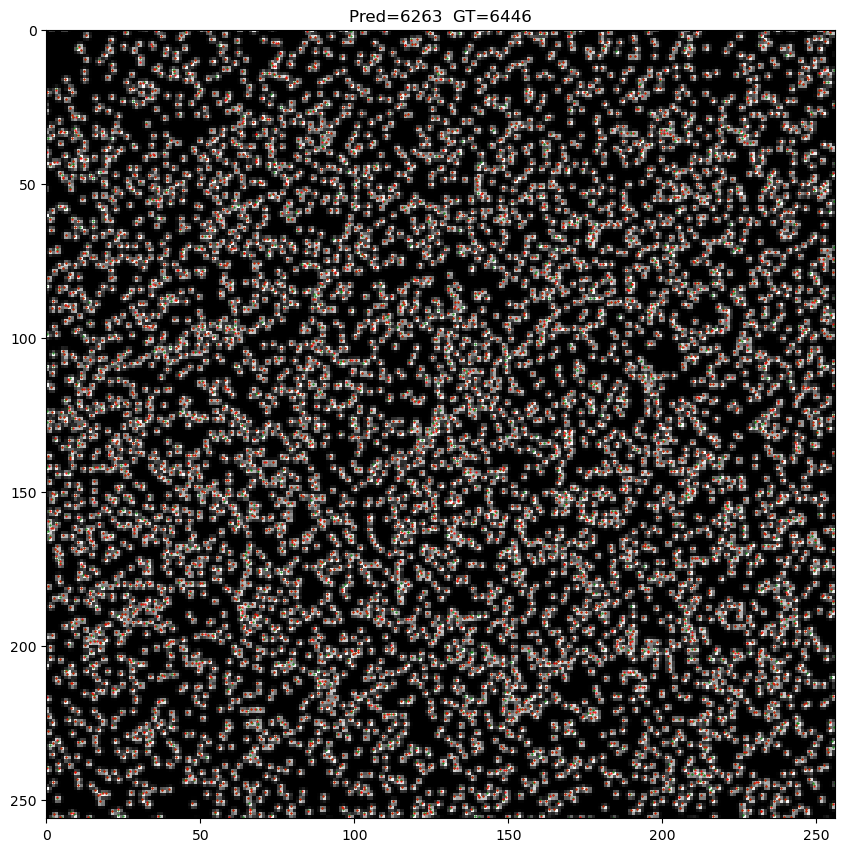

In [34]:
# visualize_one_val_tile.py
import os, glob, random
import numpy as np
import torch


# ==== 路径 ====
STACK_DIR   = r"D:/0.Code/OpenLPTGUI/OpenLPT/test/inputs/test_PeakCNN/train_data/stacked_tiles256"
WEIGHTS_OUT = os.path.join(STACK_DIR, "peakcnn_openlpt.pth")

# ==== 与训练一致的随机种子 & 划分 ====
SEED = 2025
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

# ==== 找到 val 集的一张样本 ====
files = sorted(glob.glob(os.path.join(STACK_DIR, "*.npz")))
assert files, f"No .npz in {STACK_DIR}"
random.Random(SEED).shuffle(files)
n_train = int(0.8 * len(files))
val_files = files[n_train:]
assert val_files, "val set is empty"
sample_path = random.choice(val_files)
print("Sample:", sample_path)

# ==== 读取样本 ====
d = np.load(sample_path, allow_pickle=False)
img = d["img"].astype(np.float32)   # (H, W) in [0,1]
H, W = img.shape
gt_pts = d["pts"].astype(np.float32) if "pts" in d else np.zeros((0,2), np.float32)

# ==== 构造模型并加载权重（假设你已定义 PeakCNN 类 & predict_points 函数）====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PeakCNN().to(device)                 # <-- 你的模型类
state = torch.load(WEIGHTS_OUT, map_location=device)
model.load_state_dict(state)
model.eval()

# ==== 推理（使用你已有的 predict_points）====
x = torch.from_numpy(img[None, None, ...]).to(device)   # (1,1,H,W)
with torch.no_grad():
    pred_xy = predict_points(model, x, thr=0.6)         # <-- 你的函数名

def to_numpy_cpu(x):
    import numpy as np, torch
    if isinstance(x, torch.Tensor):
        return x.detach().cpu().numpy()
    return np.asarray(x)

# ✅ 统一转为 numpy(cpu)，无论是空/非空、Tensor/Numpy 都安全
pred_xy = to_numpy_cpu(pred_xy)

# 确保形状为 (N,2)，即使空也 ok
pred_xy = pred_xy.reshape(-1, 2)
gt_pts  = gt_pts.reshape(-1, 2)

print(f"Pred points: {len(pred_xy)}, GT points: {len(gt_pts)}")
print("[types] img:", type(img), "pred_xy:", type(pred_xy), "gt_pts:", type(gt_pts))
print(img.shape)

# ==== 可视化：原图 + 预测点 (+ GT) ====
import matplotlib.pyplot as plt
H, W = img.shape[:2]
dpi = plt.rcParams.get('figure.dpi', 100)
scale = 4.0
fig_w = (W * scale) / dpi
fig_h = (H * scale) / dpi
plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)
# img8 = np.clip(img * 255.0, 0, 255).astype(np.uint8)
plt.imshow(img, extent=(0, W, H, 0), origin='upper', cmap='gray',vmin=0, vmax=1, interpolation='nearest')
plt.plot(gt_pts[:,0], gt_pts[:,1], 'g.', markersize=1)
plt.plot(pred_xy[:,0], pred_xy[:,1], 'r.', markersize=1)

plt.xlim([0, W]); plt.ylim([H, 0])  # y 轴反向以匹配图像坐标
plt.title(f"Pred={len(pred_xy)}  GT={len(gt_pts)}")
plt.show()


In [35]:
# 封装函数，输入是图像和训练的模型，输出是检测到的点坐标
import math
import torch
import torch.nn.functional as F
import numpy as np

@torch.no_grad()
def predict_points_tiled(
    model,
    img,                      # numpy array (H,W) or torch tensor (H,W) / (1,H,W)
    thr: float = 0.30,        # 概率阈值（建议 0.25~0.40 扫一遍）
    tile: int = 256,          # 切块尺寸
    overlap: int = 32,        # 邻块重叠宽度，避免边缘效应；0 表示无重叠
    batch_size: int = 8,      # 批推理
    device: str = None        # 'cuda' or 'cpu'，默认跟随模型参数
):
    """
    返回：numpy 数组 (N,2)，每行 [x, y]（OpenLPT：像素中心=整数；x=j+u, y=i+v）
    说明：
      - 图像会先归一化到 [0,1]
      - 切块采用 stride = tile - overlap
      - 关闭 NMS，只用阈值；重叠区域用“先到先占”去重，避免重复点
    """
    # ---- 0) 准备图像 & 归一化到 [0,1] ----
    if isinstance(img, torch.Tensor):
        arr = img.detach().cpu().float().squeeze().numpy()
    else:
        arr = np.asarray(img)

    assert arr.ndim == 2, "expect grayscale image (H,W)"
    arr = arr.astype(np.float32)
    m = float(arr.max())
    if m > 1.0 + 1e-6:
        arr = arr / (m if m > 0 else 1.0)
    elif m <= 0:
        arr = np.zeros_like(arr, dtype=np.float32)
    # 此时 arr ∈ [0,1]
    H, W = arr.shape

    # ---- 1) 计算切块网格 ----
    stride = tile - overlap
    assert stride > 0, "overlap must be < tile"
    n_y = math.ceil((H - tile) / stride) + 1 if H > tile else 1
    n_x = math.ceil((W - tile) / stride) + 1 if W > tile else 1

    # 需要 padding 以完整覆盖
    pad_H = max(0, (n_y - 1) * stride + tile - H)
    pad_W = max(0, (n_x - 1) * stride + tile - W)
    # 反射 padding（边缘更自然）
    arr_pad = np.pad(arr, ((0, pad_H), (0, pad_W)), mode='reflect')
    Hp, Wp = arr_pad.shape

    # 生成所有 tile 左上角坐标
    y0_list = [i * stride for i in range(n_y)]
    x0_list = [j * stride for j in range(n_x)]
    coords = [(y0, x0) for y0 in y0_list for x0 in x0_list]

    # ---- 2) 前向推理（分批） ----
    if device is None:
        device = next(model.parameters()).device
    model.eval()

    # 重叠区去重：先到先占
    occupied = np.zeros((H, W), dtype=bool)
    out_pts = []

    def _flush(batch_tiles, batch_origins):
        if not batch_tiles:
            return
        x = torch.from_numpy(np.stack(batch_tiles)).unsqueeze(1).to(device)  # (B,1,256,256)
        pred = model(x)  # (B,3,256,256)
        logit = pred[:, 0:1]
        u_hat  = pred[:, 1:2]
        v_hat  = pred[:, 2:3]
        prob = torch.sigmoid(logit)                        # (B,1,h,w)

        # 仅阈值，无 NMS
        keep = (prob >= thr)

        for b in range(keep.shape[0]):
            yy, xx = torch.where(keep[b,0])               # 局部 i,j
            if yy.numel() == 0:
                continue
            # 局部亚像素 → 局部浮点坐标
            xs_local = xx.float() + u_hat[b,0,yy,xx]
            ys_local = yy.float() + v_hat[b,0,yy,xx]
            # 平移到全图坐标
            y0, x0 = batch_origins[b]
            xs = xs_local + float(x0)
            ys = ys_local + float(y0)
            # 过滤 padding 外点，并做先到先占去重
            xs = xs.cpu().numpy(); ys = ys.cpu().numpy()
            for xg, yg in zip(xs, ys):
                if 0 <= xg < W and 0 <= yg < H:
                    i = int(math.floor(yg))
                    j = int(math.floor(xg))
                    if not occupied[i, j]:
                        out_pts.append((float(xg), float(yg)))
                        occupied[i, j] = True

    batch_tiles, batch_origins = [], []
    for (y0, x0) in coords:
        tile_img = arr_pad[y0:y0+tile, x0:x0+tile]
        batch_tiles.append(tile_img)
        batch_origins.append((y0, x0))
        if len(batch_tiles) == batch_size:
            _flush(batch_tiles, batch_origins)
            batch_tiles, batch_origins = [], []
    _flush(batch_tiles, batch_origins)

    if not out_pts:
        return np.zeros((0, 2), dtype=np.float32)
    return np.array(out_pts, dtype=np.float32)


GT: 100000, Model: 95976, LPT: 79614


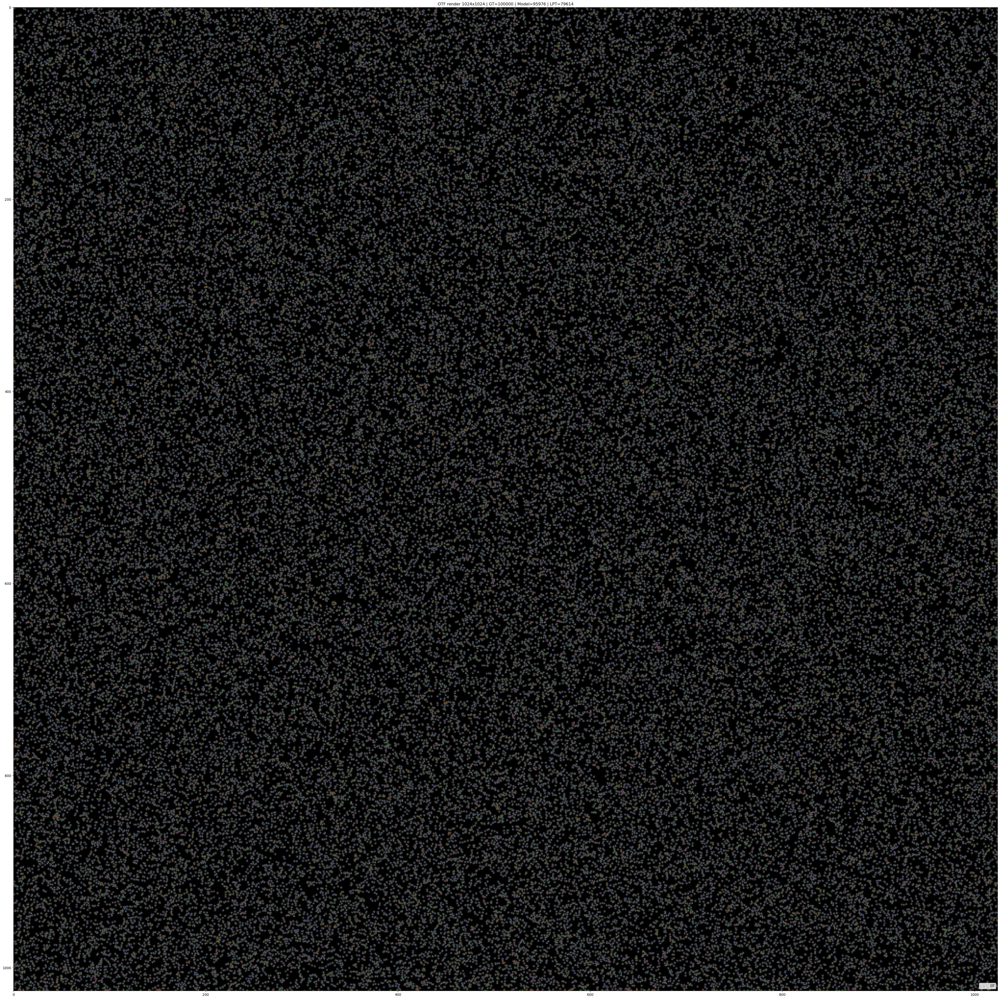

In [36]:
# %% 1024x1024 随机10k点 → OTF渲染成8-bit → 调用 predict_points_tiled & LPT → 叠加对比
import math, numpy as np, matplotlib.pyplot as plt

def render_gaussian(img, x, y, A, sx, sy, alpha):
    """在灰度图 img 上绘制一个椭圆高斯（支持亚像素中心与旋转）"""
    h, w = img.shape
    R = int(math.ceil(3.0 * max(sx, sy)))  # 核半径范围 3σ
    cos_a, sin_a = math.cos(alpha), math.sin(alpha)

    x0, y0 = int(x), int(y)
    ymin, ymax = max(0, y0 - R), min(h - 1, y0 + R)
    xmin, xmax = max(0, x0 - R), min(w - 1, x0 + R)

    for yy in range(ymin, ymax + 1):
        dy = yy - y
        for xx in range(xmin, xmax + 1):
            dx = xx - x
            # 旋转到 OTF 主轴坐标
            xr =  cos_a * dx + sin_a * dy
            yr = -sin_a * dx + cos_a * dy
            val = A * math.exp(-0.5 * ((xr/sx)**2 + (yr/sy)**2))
            img[yy, xx] = max(img[yy, xx], val)  # max合成（防止过曝）

# ---------------- 参数 ----------------
H, W = 1024, 1024
N_pts = 100000
A, sigma_x, sigma_y, alpha = 124.0, 0.65, 0.65, 0.0
rng = np.random.default_rng(42)

# 生成随机 GT 点
xs = rng.uniform(0, W, size=N_pts).astype(np.float32)
ys = rng.uniform(0, H, size=N_pts).astype(np.float32)
gt_pts = np.stack([xs, ys], axis=1)

# ---------------- 渲染 ----------------
img = np.zeros((H, W), dtype=np.float32)
for x, y in gt_pts:
    render_gaussian(img, x, y, A, sigma_x, sigma_y, alpha)

# 转 uint8
img_u8 = np.clip(img, 0, 255).astype(np.uint8)

# ---------------- 模型与 LPT 检测 ----------------
pred_pts = predict_points_tiled(model, img_u8, thr=0.5, tile=256, overlap=8, batch_size=8)

lpt_img = lpt.Image.from_numpy(img_u8)
obj_finder = lpt.ObjectFinder2D()
obj2ds  = obj_finder.findObject2D(lpt_img, tr_cfg)
lpt_pts = np.array([[o._pt_center[0], o._pt_center[1]] for o in obj2ds], dtype=np.float32)

print(f"GT: {len(gt_pts)}, Model: {len(pred_pts)}, LPT: {len(lpt_pts)}")

# ---------------- 5) 三类点叠加绘图 ----------------
H, W = img.shape[:2]
dpi = plt.rcParams.get('figure.dpi', 100)
scale = 4.0
fig_w = (W * scale) / dpi
fig_h = (H * scale) / dpi
plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)
plt.imshow(img, extent=(0, W, H, 0), origin='upper', cmap='gray',vmin=0, vmax=255, interpolation='nearest')

# GT
plt.scatter(gt_pts[:,0], gt_pts[:,1], s=3, c='green', marker='o', facecolors='none', label='GT', alpha=0.6)

# Model
if len(pred_pts):
    plt.plot(pred_pts[:,0], pred_pts[:,1], 'r.', markersize=1)

# LPT
if len(lpt_pts):
    plt.plot(lpt_pts[:,0], lpt_pts[:,1], 'b.', markersize=1)

plt.xlim(0, W); plt.ylim(H, 0)
plt.legend(loc='lower right')
plt.title(f"OTF render {H}x{W} | GT={N_pts} | Model={len(pred_pts)} | LPT={len(lpt_pts)}")
plt.tight_layout()
plt.show()


N=  1000 | Model: hit= 0.979, MAE=0.104, RMSE=0.140 | LPT: hit= 0.998, MAE=0.005, RMSE=0.027
N=  5000 | Model: hit= 0.975, MAE=0.090, RMSE=0.122 | LPT: hit= 0.988, MAE=0.010, RMSE=0.049
N= 10000 | Model: hit= 0.976, MAE=0.082, RMSE=0.113 | LPT: hit= 0.975, MAE=0.021, RMSE=0.091
N= 20000 | Model: hit= 0.978, MAE=0.069, RMSE=0.097 | LPT: hit= 0.956, MAE=0.037, RMSE=0.123
N= 30000 | Model: hit= 0.977, MAE=0.065, RMSE=0.096 | LPT: hit= 0.939, MAE=0.054, RMSE=0.150
N= 40000 | Model: hit= 0.976, MAE=0.063, RMSE=0.098 | LPT: hit= 0.919, MAE=0.069, RMSE=0.172
N= 50000 | Model: hit= 0.973, MAE=0.065, RMSE=0.105 | LPT: hit= 0.902, MAE=0.086, RMSE=0.194
N= 75000 | Model: hit= 0.965, MAE=0.073, RMSE=0.124 | LPT: hit= 0.857, MAE=0.121, RMSE=0.234
N=100000 | Model: hit= 0.953, MAE=0.090, RMSE=0.153 | LPT: hit= 0.817, MAE=0.155, RMSE=0.268
N=200000 | Model: hit= 0.899, MAE=0.172, RMSE=0.261 | LPT: hit= 0.677, MAE=0.270, RMSE=0.370


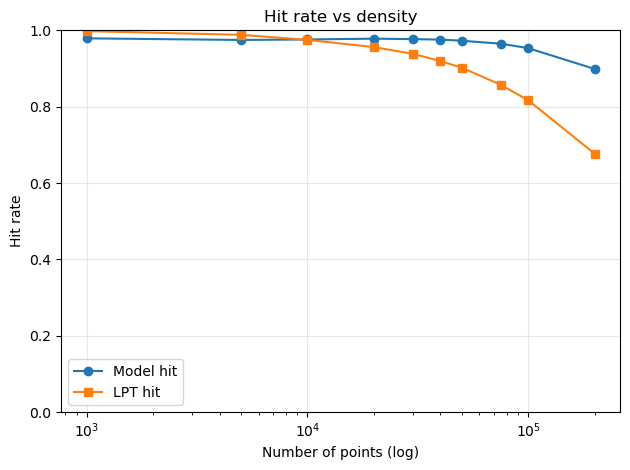

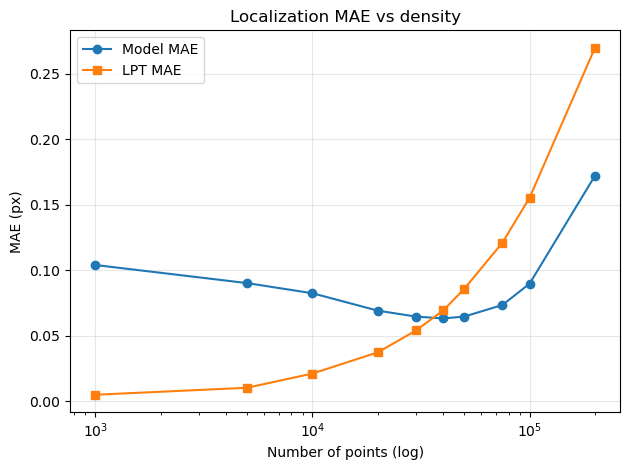

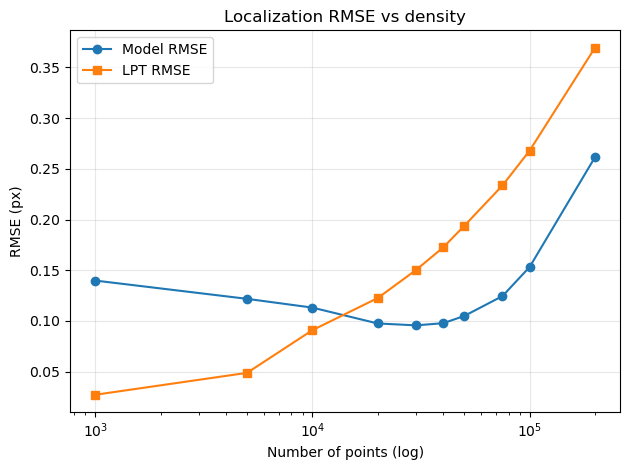

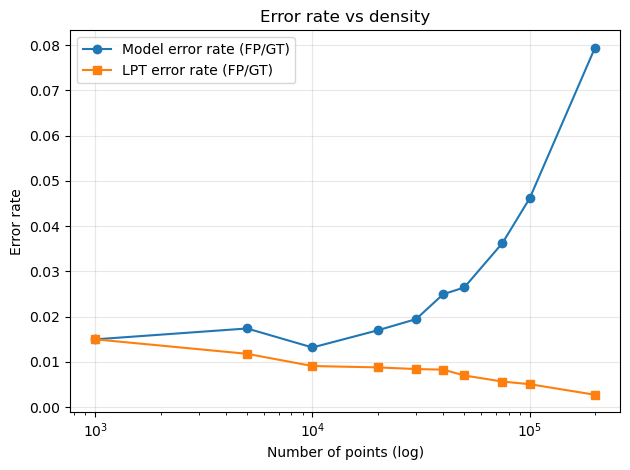

In [37]:
# %% PeakCNN vs LPT 评估：命中率 & 误差 随密度变化
import numpy as np, math, matplotlib.pyplot as plt

H, W = 1024, 1024
N_LIST = [1000, 5000, 10000, 20000, 30000, 40000, 50000, 75000, 100000, 200000]
A, sx, sy, alpha = 124.0, 0.65, 0.65, 0.0
rng = np.random.default_rng(42)
R_MATCH = 1.0  # 命中阈值（像素）

def gen_unique_pts(n):
    """像素唯一：先无放回抽取像素，再加亚像素抖动"""
    idx = rng.choice(H*W, size=n, replace=False)
    iy, ix = np.divmod(idx, W)
    # 亚像素抖动（确保仍在像素内）
    fx = rng.uniform(0, 1, size=n).astype(np.float32)
    fy = rng.uniform(0, 1, size=n).astype(np.float32)
    return np.stack([ix.astype(np.float32) + fx, iy.astype(np.float32) + fy], 1)

def render_scene(pts):
    img = np.zeros((H, W), np.float32)
    for x, y in pts:
        render_gaussian(img, float(x), float(y), A, sx, sy, alpha)
    return np.clip(img, 0, 255).astype(np.uint8)

def detect_model(img_u8):
    pts = predict_points_tiled(model, img_u8, thr=0.5, tile=256, overlap=8, batch_size=8)
    return np.asarray(pts, dtype=np.float32) if len(pts) else np.zeros((0,2), np.float32)

def detect_lpt(img_u8):
    img = lpt.Image.from_numpy(img_u8)
    of  = lpt.ObjectFinder2D()
    objs = of.findObject2D(img, tr_cfg)
    if not objs: return np.zeros((0,2), np.float32)
    return np.array([[o._pt_center[0], o._pt_center[1]] for o in objs], np.float32)

def build_pixel_map(pts):
    """把预测点按整数像素格归档，加速近邻(<=1像素)检索"""
    m = {}
    if len(pts)==0: return m
    ix = np.clip(np.floor(pts[:,0]).astype(int), 0, W-1)
    iy = np.clip(np.floor(pts[:,1]).astype(int), 0, H-1)
    for p, x, y in zip(pts, ix, iy):
        m.setdefault((x,y), []).append(p)
    return m

def hit_err_fp_rate(gt, pred, r_match=1.0):
    """
    一对一贪心匹配：每个GT匹配最近、且未被占用的预测点（距离<=r_match）。
    返回：
      hit_rate = TP / N_gt
      mae, rmse = 命中样本上的误差统计
      err_rate = FP / N_gt   （FP=未匹配到GT的预测点）
    """
    n_gt, n_pr = len(gt), len(pred)
    if n_gt == 0:
        return 0.0, np.nan, np.nan, (float(n_pr) if n_pr else 0.0)  # 退化情况

    if n_pr == 0:
        return 0.0, np.nan, np.nan, 0.0

    # 构建像素桶，加速近邻（与之前相同）
    pmap = {}
    ix = np.clip(np.floor(pred[:,0]).astype(int), 0, W-1)
    iy = np.clip(np.floor(pred[:,1]).astype(int), 0, H-1)
    for j,(x,y) in enumerate(zip(ix,iy)):
        pmap.setdefault((x,y), []).append(j)

    used_pred = np.zeros(n_pr, dtype=bool)
    tp_dists = []

    for gx, gy in gt:
        xi, yi = int(gx), int(gy)
        best_d, best_j = 1e9, -1
        # 搜索3x3像素邻域
        for yy in (yi-1, yi, yi+1):
            if yy < 0 or yy >= H: continue
            for xx in (xi-1, xi, xi+1):
                if xx < 0 or xx >= W: continue
                lst = pmap.get((xx,yy))
                if not lst: continue
                for j in lst:
                    if used_pred[j]: continue
                    px, py = pred[j]
                    d = math.hypot(px-gx, py-gy)
                    if d < best_d:
                        best_d, best_j = d, j
        if best_d <= r_match and best_j >= 0:
            used_pred[best_j] = True
            tp_dists.append(best_d)

    TP = len(tp_dists)
    FP = int(n_pr - used_pred.sum())
    hit_rate = TP / n_gt
    mae = (np.mean(tp_dists) if TP else np.nan)
    rmse = (math.sqrt(np.mean(np.square(tp_dists))) if TP else np.nan)
    err_rate = FP / n_gt
    return hit_rate, mae, rmse, err_rate


# ---- 主循环：不同点数评估 ----
m_hit, m_mae, m_rmse = [], [], []
l_hit, l_mae, l_rmse = [], [], []
m_err, l_err = [], []

for N in N_LIST:
    gt = gen_unique_pts(N)
    img = render_scene(gt)

    pred_m = detect_model(img)
    pred_l = detect_lpt(img)

    hr_m, mae_m, rmse_m, er_m = hit_err_fp_rate(gt, pred_m, r_match=R_MATCH)
    hr_l, mae_l, rmse_l, er_l = hit_err_fp_rate(gt, pred_l, r_match=R_MATCH)

    m_hit.append(hr_m); m_mae.append(mae_m); m_rmse.append(rmse_m); m_err.append(er_m)
    l_hit.append(hr_l); l_mae.append(mae_l); l_rmse.append(rmse_l); l_err.append(er_l)


    print(f"N={N:6d} | Model: hit={hr_m:6.3f}, MAE={m_mae[-1]:.3f}, RMSE={m_rmse[-1]:.3f} | "
          f"LPT: hit={hr_l:6.3f}, MAE={l_mae[-1]:.3f}, RMSE={l_rmse[-1]:.3f}")

# ---- 绘图 ----
plt.figure(); plt.plot(N_LIST, m_hit, marker='o', label='Model hit'); plt.plot(N_LIST, l_hit, marker='s', label='LPT hit')
plt.xscale('log'); plt.ylim(0,1); plt.xlabel('Number of points (log)'); plt.ylabel('Hit rate'); plt.title('Hit rate vs density'); plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout()

plt.figure(); plt.plot(N_LIST, m_mae, marker='o', label='Model MAE'); plt.plot(N_LIST, l_mae, marker='s', label='LPT MAE')
plt.xscale('log'); plt.xlabel('Number of points (log)'); plt.ylabel('MAE (px)'); plt.title('Localization MAE vs density'); plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout()

plt.figure(); plt.plot(N_LIST, m_rmse, marker='o', label='Model RMSE'); plt.plot(N_LIST, l_rmse, marker='s', label='LPT RMSE')
plt.xscale('log'); plt.xlabel('Number of points (log)'); plt.ylabel('RMSE (px)'); plt.title('Localization RMSE vs density'); plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout()
plt.figure()
plt.plot(N_LIST, m_err, marker='o', label='Model error rate (FP/GT)')
plt.plot(N_LIST, l_err, marker='s', label='LPT error rate (FP/GT)')
plt.xscale('log'); plt.xlabel('Number of points (log)')
plt.ylabel('Error rate'); plt.title('Error rate vs density')
plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout()


plt.show()


Generating & predicting for 4 cameras...
[cam0] GT=61832, Pred=59975, lpt=52694
[cam1] GT=61832, Pred=60135, lpt=52907
[cam2] GT=61832, Pred=60035, lpt=52541
[cam3] GT=61832, Pred=60195, lpt=52439
✅ Done. 结果在内存变量：imgs_by_cam / gts_by_cam / preds_by_cam


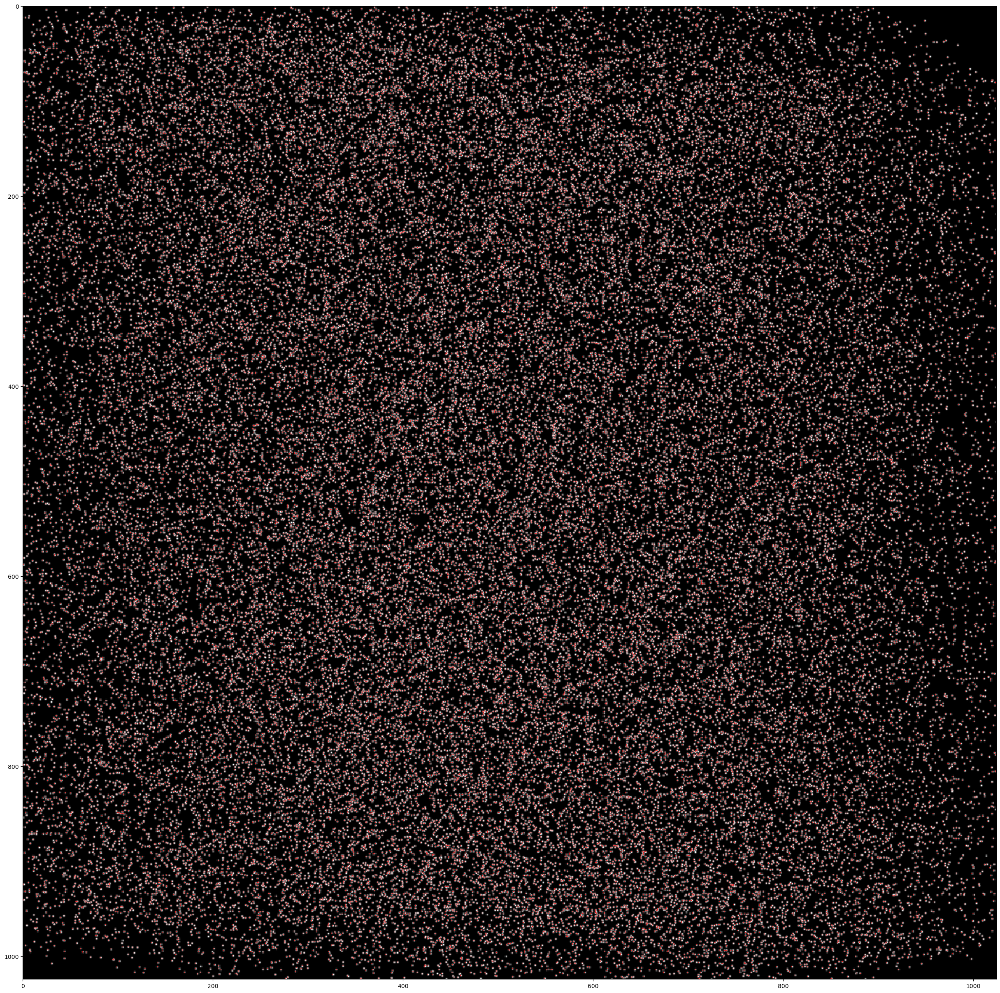

In [42]:
import numpy as np

# ===== 参数（按你前面的设置）=====
A, sigma_x, sigma_y, alpha = 125.0, 0.65, 0.65, 0.0
tr_radius = 2
thr, tile, overlap, batch_size = 0.5, 256, 8, 8

# 图像尺寸
h_img = cam_list[0].getNRow()
w_img = cam_list[0].getNCol()

# ===== 结果容器 =====
image_list = []   # 保存生成的8-bit图像（仅内存）
gts_list  = []   # 每个相机的GT点 (N,2) float32
obj2d_list_identified = []  # 每个相机的预测点 (M,2) 
obj2d_list_lpt = []  # 每个相机的 LPT 预测点 (M,2)

num_cams = min(4, len(obj2d_list))
print(f"Generating & predicting for {num_cams} cameras...")

for cam_idx in range(num_cams):
    # 该相机的GT点（亚像素）
    pts2d = np.array(
        [(float(o._pt_center[0]), float(o._pt_center[1])) for o in obj2d_list[cam_idx]],
        dtype=np.float32
    )

    # 生成浮点灰度图
    img = np.zeros((h_img, w_img), dtype=np.float32)
    for x, y in pts2d:
        if 0 <= x < w_img and 0 <= y < h_img:
            # 使用你已定义好的函数（不再重新定义）
            render_gaussian(img, x, y, A, sigma_x, sigma_y, alpha)

    # 归一化到 0-255（uint8）供模型使用
    mx = float(img.max())
    img_u8 = (img / mx * 255.0).astype(np.uint8) if mx > 1e-8 else np.zeros_like(img, dtype=np.uint8)

    # 若你的模型期望 [0,1] 浮点输入，可改为：
    # img_model_in = (img_u8.astype(np.float32) / 255.0)
    img_model_in = img_u8

    # 预测
    pred_xy = predict_points_tiled(model, img_model_in, thr=thr, tile=tile, overlap=overlap, batch_size=batch_size)

    obj2ds = []
    for id in range(pred_xy.shape[0]):
        pt = pred_xy[id, :]
        obj = lpt.Tracer2D(lpt.Pt2D(float(pt[0]), float(pt[1])))
        obj2ds.append(obj)
    
    obj2d_list_identified.append(obj2ds)

    img_lpt = lpt.Image.from_numpy(img_u8)
    of = lpt.ObjectFinder2D()
    obj2ds_lpt = of.findObject2D(img_lpt, tr_cfg)
    obj2d_list_lpt.append(obj2ds_lpt)

    # 收集结果
    image_list.append(img_u8)
    gts_list.append(pts2d)

    print(f"[cam{cam_idx}] GT={len(pts2d)}, Pred={len(pred_xy)}, lpt={len(obj2ds_lpt)}")

print("✅ Done. 结果在内存变量：imgs_by_cam / gts_by_cam / preds_by_cam")
img = image_list[1]
points = obj2d_list_identified[1]
xs = [p._pt_center[0] for p in points]
ys = [p._pt_center[1] for p in points]

def show_pixels(img, xs=None, ys=None, scale=1.0):
    """
    零边距像素级显示：
      - scale：把图在屏幕上按倍数放大（不改变数据像素）
    """
    H, W = img.shape[:2]
    dpi = plt.rcParams.get('figure.dpi', 100)
    fig_w = (W * scale) / dpi
    fig_h = (H * scale) / dpi

    plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)

    # plt.imshow(img, cmap='gray', interpolation='nearest')
    # set the extent to match pixel coordinates: the center of the top-left pixel is at (0.5, 0.5)
    plt.imshow(img, extent=(0, W, H, 0), origin='upper', cmap='gray', interpolation='nearest')

    # xs = np.asarray(xs, dtype=float) - 0.5
    # ys = np.asarray(ys, dtype=float) - 0.5
    if xs is not None and ys is not None:
        plt.plot(xs , ys, 'r.', markersize=1)  # 像素级标记
    plt.plot(0, 0, 'g.', markersize=1)  # 原点标记
    plt.show()

show_pixels(img, xs, ys, scale=3.0)

In [43]:
# stereomatch on identified 2D objects from CNN model
stereomatch = lpt.StereoMatch(cam_list, obj2d_list_identified, tr_cfg)

with lpt.PythonStreamRedirector():
    obj3d_list_identified = stereomatch.match()
print(f"Matched {len(obj3d_list_identified)} 3D objects.")

pts_identified = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list_identified], dtype=float)
    if obj3d_list else np.empty((0, 3))
)

pts_groundtrue = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
import sys, pathlib
repo_root = pathlib.Path.cwd().parent          # for finding openLPT_utils
sys.path.insert(0, str(repo_root))

from openLPT_utils.ghost_eval import find_ghosts

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
tol_mm = 0.6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_identified, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

Matched 49184 3D objects.
real=48957, ghosts=227


In [44]:
# stereomatch on identified 2D objects from lpt
stereomatch = lpt.StereoMatch(cam_list, obj2d_list_lpt, tr_cfg)

with lpt.PythonStreamRedirector():
    obj3d_list_lpt = stereomatch.match()
print(f"Matched {len(obj3d_list_lpt)} 3D objects.")

pts_identified = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list_lpt], dtype=float)
    if obj3d_list else np.empty((0, 3))
)

pts_groundtrue = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
import sys, pathlib
repo_root = pathlib.Path.cwd().parent          # for finding openLPT_utils
sys.path.insert(0, str(repo_root))

from openLPT_utils.ghost_eval import find_ghosts

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
tol_mm = 0.6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_identified, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

Matched 34232 3D objects.
real=33245, ghosts=987
